# Pulmonary Localization Using Convolutional Neural Networks - VGG Architecture
***

### 1. Importing and Installing Packages
***

In [ ]:
!pip install lungs-segmentation

In [ ]:
from lungs_segmentation.pre_trained_models import create_model
from sklearn.model_selection import train_test_split
import lungs_segmentation.inference as inference
from bbox_delimiters import bbox_utils
import matplotlib.pyplot as plt
import urllib.request as url
import tensorflow as tf
import pandas as pd
import numpy as np
import shutil
import random
import glob
import time
import cv2
import torch

In [ ]:
seg_model = bbox_utils().model_segmentation(architecture = 'resnet34')

### 2. Importing CheXpert Data
***

In [ ]:
drive.mount('/content/gdrive', force_remount = True)
!cp -r /content/gdrive/MyDrive/chexpert-v10-small.zip /content/
!unzip /content/chexpert-v10-small.zip
!rm /content/chexpert-v10-small.zip

### 3. Creating Training, Validation, and Testing Dataframes
***

In [ ]:
train_data = pd.read_csv('/content/train-data.csv', delimiter = ',',
                         usecols = ['Path', 'p1_x', 'p1_y', 'p2_x', 'p2_y'])
test_data = pd.read_csv('/content/test-data.csv', delimiter = ',',
                        usecols = ['Path', 'p1_x', 'p1_y', 'p2_x', 'p2_y'])
val_data = pd.read_csv('/content/val-data.csv', delimiter = ',',
                       usecols = ['Path', 'p1_x', 'p1_y', 'p2_x', 'p2_y'])

print('Training Images: {} images'.format(len(train_data)))
print('Validation Images: {} images'.format(len(val_data)))
print('Test Images: {} images'.format(len(test_data)))

Training Images: 152808 images
Validation Images: 19051 images
Test Images: 19101 images


### 4. Preparing Data for the Network
***

In [ ]:
def make_gen(dataframe):
  '''
  build an image generator from a dataframe

  Args:
    dataframe (dataframe) --> pandas pack data set

  Returns:
    gen (generator) --> keras data generator
  '''

  data_gen = tf.keras.preprocessing.image.ImageDataGenerator(rescale = 1./255.)
  gen = data_gen.flow_from_dataframe(dataframe = dataframe, directory = '', x_col = 'Path',
                                     y_col = ['p1_x', 'p1_y', 'p2_x', 'p2_y'], 
                                     target_size = (128, 128), color_mode ='rgb', batch_size = 128,
                                     class_mode='raw', shuffle = True, seed = 42)
  
  return gen

In [ ]:
train_generator = make_gen(dataframe = train_data)
validation_generator = make_gen(dataframe = val_data)
test_generator = make_gen(dataframe = test_data)

Found 152808 validated image filenames.
Found 19051 validated image filenames.
Found 19101 validated image filenames.


### 5. Organizing the Network Architecture
***

In [ ]:
conv_base = tf.keras.applications.VGG16(input_shape = (128, 128,3), include_top = False, weights = 'imagenet')

In [175]:
layers_name = list()
for layer in conv_base.layers:
  layers_name.append(layer.name)

block_names = ['input_6', 'block1_pool', 'block2_pool', 'block3_conv3', 'block4_conv2']

for blocks in block_names:
  try:
    layers_name.index(blocks)
    print('Bloco ' + blocks + ' found!')
  except ValueError:
    print('Bloco ' + blocks + ' not found!')

Bloco input_6 found!
Bloco block1_pool found!
Bloco block2_pool found!
Bloco block3_conv3 found!
Bloco block4_conv2 found!


In [176]:
inputs = tf.keras.Input(shape=(128, 128, 3))
feature_extractor = conv_base(inputs)

x = tf.keras.layers.GlobalAveragePooling2D()(feature_extractor)
x = tf.keras.layers.Flatten()(x)
x = tf.keras.layers.Dense(units = 512, activation = tf.nn.relu)(x)
x = tf.keras.layers.Dense(units = 256, activation = tf.nn.relu)(x)
x = tf.keras.layers.Dense(units = 64, activation = tf.nn.relu)(x)

bounding_box_regression_output = tf.keras.layers.Dense(units = 4)(x)
model = tf.keras.models.Model(inputs = inputs, outputs = bounding_box_regression_output)

model.compile(optimizer=tf.keras.optimizers.SGD(momentum = 0.9), loss = 'mean_squared_error', metrics = ['acc'])

In [177]:
model.summary()

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_7 (InputLayer)         [(None, 128, 128, 3)]     0         
_________________________________________________________________
vgg16 (Functional)           (None, 4, 4, 512)         14714688  
_________________________________________________________________
global_average_pooling2d_2 ( (None, 512)               0         
_________________________________________________________________
flatten_2 (Flatten)          (None, 512)               0         
_________________________________________________________________
dense_8 (Dense)              (None, 512)               262656    
_________________________________________________________________
dense_9 (Dense)              (None, 256)               131328    
_________________________________________________________________
dense_10 (Dense)             (None, 64)                1644

In [178]:
def freeze_layers(conv_base, layer_name):
  '''
  freeze layers of convolutional neural network training

  Args:
    conv_base (tensor) --> convolutional layers of the model
    layer_name (str) --> name of the freezing weight boundary layer
  '''

  conv_base.trainable = True
  set_trainable = False

  for layer in conv_base.layers:
    if layer.name == layer_name:
      set_trainable = True
    if set_trainable:
      layer.trainable = True
    else:
      layer.trainable = False
  
  return None

### 5. Organizing the Assessment Metric (IoU)
***

In [ ]:
def intersection_over_union(pred_box, true_box, smoothing_factor = 1e-10):
  '''
  intersection metric on the Union of bounding boxes

  Args:
    pred_box (list) --> coordinates of predicted bounding boxes
    true_box (list) --> coordinates of the original bounding boxes

  Returns:
    iou (int) --> calculated IoU metric
  '''

  xmin_pred, ymin_pred, xmax_pred, ymax_pred =  pred_box
  xmin_true, ymin_true, xmax_true, ymax_true = true_box

  xmin_overlap = np.maximum(xmin_pred, xmin_true)
  xmax_overlap = np.minimum(xmax_pred, xmax_true)
  ymin_overlap = np.maximum(ymin_pred, ymin_true)
  ymax_overlap = np.minimum(ymax_pred, ymax_true)

  pred_box_area = (xmax_pred - xmin_pred) * (ymax_pred - ymin_pred)
  true_box_area = (xmax_true - xmin_true) * (ymax_true - ymin_true)

  overlap_area = np.maximum((xmax_overlap - xmin_overlap), 0)  * np.maximum((ymax_overlap - ymin_overlap), 0)
  union_area = (pred_box_area + true_box_area) - overlap_area
    
  iou = (overlap_area + smoothing_factor) / (union_area + smoothing_factor)

  return iou

### 6. Getting Test Data
***

In [ ]:
for i in range(0, len(test_generator)):
  x, y = test_generator[i]
  if i == 0:
    test_images, test_labels = x, y
  else:
    test_images, test_labels = np.concatenate((test_images, x)), np.concatenate((test_labels, y))

### 7. Model Training
***

In [179]:
checkpoint = tf.keras.callbacks.ModelCheckpoint(filepath = 'weights.hdf5', monitor = 'val_acc', verbose = True, 
                                                save_best_only = True, save_weights_only = True, mode = 'max')
callbacks = [checkpoint]

In [184]:
 freeze_layers(conv_base = conv_base, layer_name = block_names[4])
 model.summary()

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_7 (InputLayer)         [(None, 128, 128, 3)]     0         
_________________________________________________________________
vgg16 (Functional)           (None, 4, 4, 512)         14714688  
_________________________________________________________________
global_average_pooling2d_2 ( (None, 512)               0         
_________________________________________________________________
flatten_2 (Flatten)          (None, 512)               0         
_________________________________________________________________
dense_8 (Dense)              (None, 512)               262656    
_________________________________________________________________
dense_9 (Dense)              (None, 256)               131328    
_________________________________________________________________
dense_10 (Dense)             (None, 64)                1644

In [185]:
history = model.fit(train_generator, validation_data = validation_generator, 
                    epochs = 4, verbose = True, use_multiprocessing = True,
                    workers = 8, callbacks = callbacks)

Epoch 1/4
1194/1194 [==============================] - 709s 579ms/step - loss: 0.0026 - acc: 0.8225 - val_loss: 0.0013 - val_acc: 0.8637

Epoch 00001: val_acc improved from -inf to 0.86373, saving model to weights.hdf5
Epoch 2/4
1194/1194 [==============================] - 678s 564ms/step - loss: 0.0013 - acc: 0.8720 - val_loss: 0.0012 - val_acc: 0.8763

Epoch 00002: val_acc improved from 0.86373 to 0.87633, saving model to weights.hdf5
Epoch 3/4
1194/1194 [==============================] - 679s 566ms/step - loss: 0.0011 - acc: 0.8823 - val_loss: 0.0011 - val_acc: 0.8832

Epoch 00003: val_acc improved from 0.87633 to 0.88316, saving model to weights.hdf5
Epoch 4/4
1194/1194 [==============================] - 679s 566ms/step - loss: 0.0010 - acc: 0.8894 - val_loss: 0.0010 - val_acc: 0.8870

Epoch 00004: val_acc improved from 0.88316 to 0.88704, saving model to weights.hdf5


In [ ]:
model.save('model_vgg1')
!zip -r model_vgg1.zip /content/model_vgg1
shutil.move('/content/model_vgg1.zip', '/content/gdrive/MyDrive/lung-localization/vgg/')

In [187]:
iou_mean_list = list()
iou_scores_list = list()
pred_boxes = model.predict(test_images)

scores = list()
for j in range(0, len(pred_boxes)):
  scores.append(intersection_over_union(pred_boxes[j], test_labels[j]))
    
iou_mean_list.append(np.array(scores).mean())
iou_scores_list.append(scores)

print('IoU Metric: {:.2f}%'.format(iou_mean_list[0] * 100))

IoU Metric: 89.90%


In [ ]:
scores = np.array(scores)
np.savetxt('scores_model1_vgg.txt', scores)
shutil.move('/content/scores_model1_vgg.txt', '/content/gdrive/MyDrive/lung-localization/vgg/')

In [189]:
 freeze_layers(conv_base = conv_base, layer_name = block_names[3])
 model.summary()

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_7 (InputLayer)         [(None, 128, 128, 3)]     0         
_________________________________________________________________
vgg16 (Functional)           (None, 4, 4, 512)         14714688  
_________________________________________________________________
global_average_pooling2d_2 ( (None, 512)               0         
_________________________________________________________________
flatten_2 (Flatten)          (None, 512)               0         
_________________________________________________________________
dense_8 (Dense)              (None, 512)               262656    
_________________________________________________________________
dense_9 (Dense)              (None, 256)               131328    
_________________________________________________________________
dense_10 (Dense)             (None, 64)                1644

In [190]:
history = model.fit(train_generator, validation_data = validation_generator, 
                    epochs = 4, verbose = True, use_multiprocessing = True,
                    workers = 8, callbacks = callbacks)

Epoch 1/4
1194/1194 [==============================] - 750s 624ms/step - loss: 9.9360e-04 - acc: 0.8942 - val_loss: 0.0010 - val_acc: 0.8909

Epoch 00001: val_acc improved from 0.88704 to 0.89087, saving model to weights.hdf5
Epoch 2/4
1194/1194 [==============================] - 756s 628ms/step - loss: 9.5694e-04 - acc: 0.8972 - val_loss: 9.7161e-04 - val_acc: 0.8875

Epoch 00002: val_acc did not improve from 0.89087
Epoch 3/4
1194/1194 [==============================] - 756s 628ms/step - loss: 9.2269e-04 - acc: 0.8997 - val_loss: 9.4267e-04 - val_acc: 0.8973

Epoch 00003: val_acc improved from 0.89087 to 0.89728, saving model to weights.hdf5
Epoch 4/4
1194/1194 [==============================] - 752s 626ms/step - loss: 9.0044e-04 - acc: 0.9021 - val_loss: 9.1609e-04 - val_acc: 0.8991

Epoch 00004: val_acc improved from 0.89728 to 0.89906, saving model to weights.hdf5


In [ ]:
model.save('model_vgg2')
!zip -r model_vgg2.zip /content/model_vgg2
shutil.move('/content/model_vgg2.zip', '/content/gdrive/MyDrive/lung-localization/vgg/')

In [192]:
pred_boxes = model.predict(test_images)

scores = list()
for j in range(0, len(pred_boxes)):
  scores.append(intersection_over_union(pred_boxes[j], test_labels[j]))
    
iou_mean_list.append(np.array(scores).mean())
iou_scores_list.append(scores)

print('Métrica IoU: {:.2f}%'.format(iou_mean_list[1] * 100))

Métrica IoU: 90.99%


In [ ]:
scores = np.array(scores)
np.savetxt('scores_model2_vgg.txt', scores)
shutil.move('/content/scores_model2_vgg.txt', '/content/gdrive/MyDrive/lung-localization/vgg/')

In [194]:
freeze_layers(conv_base = conv_base, layer_name = block_names[2])
model.summary()

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_7 (InputLayer)         [(None, 128, 128, 3)]     0         
_________________________________________________________________
vgg16 (Functional)           (None, 4, 4, 512)         14714688  
_________________________________________________________________
global_average_pooling2d_2 ( (None, 512)               0         
_________________________________________________________________
flatten_2 (Flatten)          (None, 512)               0         
_________________________________________________________________
dense_8 (Dense)              (None, 512)               262656    
_________________________________________________________________
dense_9 (Dense)              (None, 256)               131328    
_________________________________________________________________
dense_10 (Dense)             (None, 64)                1644

In [195]:
  history = model.fit(train_generator, validation_data = validation_generator, 
                    epochs = 4, verbose = True, use_multiprocessing = True,
                    workers = 8, callbacks = callbacks)

Epoch 1/4
1194/1194 [==============================] - 747s 622ms/step - loss: 8.7573e-04 - acc: 0.9035 - val_loss: 9.0496e-04 - val_acc: 0.8957

Epoch 00001: val_acc did not improve from 0.89906
Epoch 2/4
1194/1194 [==============================] - 750s 625ms/step - loss: 8.5973e-04 - acc: 0.9062 - val_loss: 8.7821e-04 - val_acc: 0.9028

Epoch 00002: val_acc improved from 0.89906 to 0.90279, saving model to weights.hdf5
Epoch 3/4
1194/1194 [==============================] - 753s 627ms/step - loss: 8.4424e-04 - acc: 0.9066 - val_loss: 9.0549e-04 - val_acc: 0.8968

Epoch 00003: val_acc did not improve from 0.90279
Epoch 4/4
1194/1194 [==============================] - 690s 573ms/step - loss: 8.3290e-04 - acc: 0.9078 - val_loss: 8.8728e-04 - val_acc: 0.9030

Epoch 00004: val_acc improved from 0.90279 to 0.90300, saving model to weights.hdf5


In [ ]:
model.save('model_vgg3')
!zip -r model_vgg3.zip /content/model_vgg3
shutil.move('/content/model_vgg3.zip', '/content/gdrive/MyDrive/lung-localization/vgg/')

In [197]:
pred_boxes = model.predict(test_images)

scores = list()
for j in range(0, len(pred_boxes)):
  scores.append(intersection_over_union(pred_boxes[j], test_labels[j]))
    
iou_mean_list.append(np.array(scores).mean())
iou_scores_list.append(scores)

print('Métrica IoU: {:.2f}%'.format(iou_mean_list[2] * 100))

Métrica IoU: 90.93%


In [ ]:
scores = np.array(scores)
np.savetxt('scores_model3_vgg.txt', scores) 
shutil.move('/content/scores_model3_vgg.txt', '/content/gdrive/MyDrive/lung-localization/vgg/')

In [199]:
freeze_layers(conv_base = conv_base, layer_name = block_names[1])
model.summary()

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_7 (InputLayer)         [(None, 128, 128, 3)]     0         
_________________________________________________________________
vgg16 (Functional)           (None, 4, 4, 512)         14714688  
_________________________________________________________________
global_average_pooling2d_2 ( (None, 512)               0         
_________________________________________________________________
flatten_2 (Flatten)          (None, 512)               0         
_________________________________________________________________
dense_8 (Dense)              (None, 512)               262656    
_________________________________________________________________
dense_9 (Dense)              (None, 256)               131328    
_________________________________________________________________
dense_10 (Dense)             (None, 64)                1644

In [200]:
history = model.fit(train_generator, validation_data = validation_generator, 
                    epochs = 4, verbose = True, use_multiprocessing = True,
                    workers = 8, callbacks = callbacks)

Epoch 1/4
1194/1194 [==============================] - 749s 623ms/step - loss: 8.1770e-04 - acc: 0.9096 - val_loss: 8.6277e-04 - val_acc: 0.9048

Epoch 00001: val_acc improved from 0.90300 to 0.90478, saving model to weights.hdf5
Epoch 2/4
1194/1194 [==============================] - 753s 627ms/step - loss: 8.0633e-04 - acc: 0.9102 - val_loss: 8.3005e-04 - val_acc: 0.9061

Epoch 00002: val_acc improved from 0.90478 to 0.90615, saving model to weights.hdf5
Epoch 3/4
1194/1194 [==============================] - 754s 627ms/step - loss: 7.9614e-04 - acc: 0.9106 - val_loss: 8.2335e-04 - val_acc: 0.9064

Epoch 00003: val_acc improved from 0.90615 to 0.90641, saving model to weights.hdf5
Epoch 4/4
1194/1194 [==============================] - 752s 626ms/step - loss: 7.8650e-04 - acc: 0.9115 - val_loss: 8.1730e-04 - val_acc: 0.9060

Epoch 00004: val_acc did not improve from 0.90641


In [ ]:
model.save('model_vgg4')
!zip -r model_vgg4.zip /content/model_vgg4
shutil.move('/content/model_vgg4.zip', '/content/gdrive/MyDrive/lung-localization/vgg/')

In [207]:
pred_boxes = model.predict(test_images)

scores = list()
for j in range(0, len(pred_boxes)):
  scores.append(intersection_over_union(pred_boxes[j], test_labels[j]))
    
iou_mean_list.append(np.array(scores).mean())
iou_scores_list.append(scores)

print('Métrica IoU: {:.2f}%'.format(iou_mean_list[3] * 100))

Métrica IoU: 91.52%


In [ ]:
scores = np.array(scores)
np.savetxt('scores_model4_vgg.txt', scores)
shutil.move('/content/scores_model4_vgg.txt', '/content/gdrive/MyDrive/lung-localization/vgg/')

In [209]:
freeze_layers(conv_base = conv_base, layer_name = block_names[0])
model.summary()

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_7 (InputLayer)         [(None, 128, 128, 3)]     0         
_________________________________________________________________
vgg16 (Functional)           (None, 4, 4, 512)         14714688  
_________________________________________________________________
global_average_pooling2d_2 ( (None, 512)               0         
_________________________________________________________________
flatten_2 (Flatten)          (None, 512)               0         
_________________________________________________________________
dense_8 (Dense)              (None, 512)               262656    
_________________________________________________________________
dense_9 (Dense)              (None, 256)               131328    
_________________________________________________________________
dense_10 (Dense)             (None, 64)                1644

In [210]:
history = model.fit(train_generator, validation_data = validation_generator, 
                    epochs = 4, verbose = True, use_multiprocessing = True,
                    workers = 8, callbacks = callbacks)

Epoch 1/4
1194/1194 [==============================] - 749s 623ms/step - loss: 7.7835e-04 - acc: 0.9129 - val_loss: 8.2637e-04 - val_acc: 0.9080

Epoch 00001: val_acc improved from 0.90641 to 0.90798, saving model to weights.hdf5
Epoch 2/4
1194/1194 [==============================] - 722s 601ms/step - loss: 7.7234e-04 - acc: 0.9127 - val_loss: 8.2870e-04 - val_acc: 0.9091

Epoch 00002: val_acc improved from 0.90798 to 0.90914, saving model to weights.hdf5
Epoch 3/4
1194/1194 [==============================] - 687s 572ms/step - loss: 7.6344e-04 - acc: 0.9132 - val_loss: 7.9909e-04 - val_acc: 0.9097

Epoch 00003: val_acc improved from 0.90914 to 0.90972, saving model to weights.hdf5
Epoch 4/4
1194/1194 [==============================] - 723s 601ms/step - loss: 7.6172e-04 - acc: 0.9135 - val_loss: 7.8462e-04 - val_acc: 0.9098

Epoch 00004: val_acc improved from 0.90972 to 0.90982, saving model to weights.hdf5


In [ ]:
model.save('model_vgg5')
!zip -r model_vgg5.zip /content/model_vgg5
shutil.move('/content/model_vgg5.zip', '/content/gdrive/MyDrive/lung-localization/vgg/')

In [212]:
pred_boxes = model.predict(test_images)

scores = list()
for j in range(0, len(pred_boxes)):
  scores.append(intersection_over_union(pred_boxes[j], test_labels[j]))
    
iou_mean_list.append(np.array(scores).mean())
iou_scores_list.append(scores)

print('Métrica IoU: {:.2f}%'.format(iou_mean_list[4] * 100))

Métrica IoU: 91.95%


In [ ]:
scores = np.array(scores)
np.savetxt('scores_model5_vgg.txt', scores)
shutil.move('/content/scores_model5_vgg.txt', '/content/gdrive/MyDrive/lung-localization/vgg/')

In [ ]:
np.savetxt('iou_mean_vgg.txt', np.array(iou_mean_list), fmt = '%s')
shutil.move('/content/iou_mean_vgg.txt', '/content/gdrive/MyDrive/lung-localization/vgg/')

## 8. Results View
***

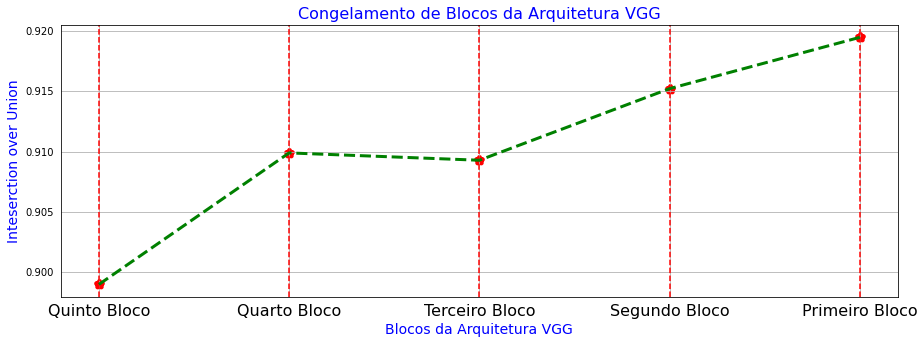

In [215]:
plt.figure(figsize = (15, 5))
x_labels = ['Quinto Bloco', 'Quarto Bloco', 'Terceiro Bloco', 'Segundo Bloco', 'Primeiro Bloco']
plt.scatter(x_labels, np.array(iou_mean_list), marker = '*', linewidths = 5, color = 'red')
for line in range(0, 5):
  plt.axvline(line, color = 'red', linestyle = '--')
plt.plot(x_labels, np.array(iou_mean_list), linestyle = '--', color = 'green', linewidth = 3)
plt.xticks(size = 16, color = 'black')
plt.yticks(color = 'black')
plt.title('Congelamento de Blocos da Arquitetura VGG', size = 16, color = 'blue')
plt.xlabel('Blocos da Arquitetura VGG', size = 14, color = 'blue')
plt.ylabel('Inteserction over Union', size = 14, color = 'blue')
plt.grid(True)

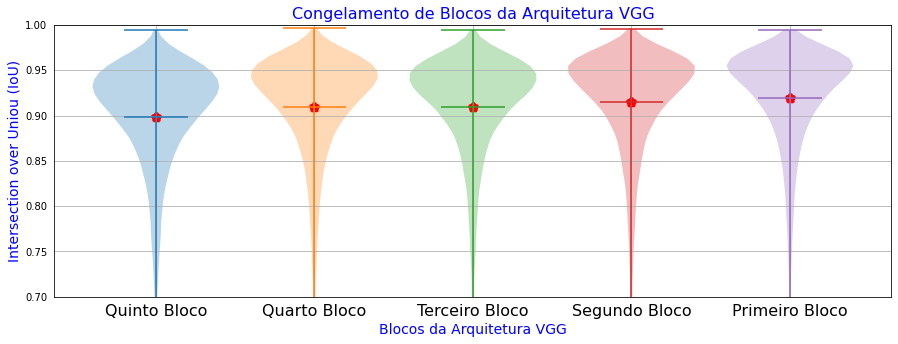

In [216]:
plt.figure(figsize = (15, 5))
plt.violinplot(iou_scores_list[0], positions = [1], showmeans = True, widths = 0.8)
plt.violinplot(iou_scores_list[1], positions = [2], showmeans = True, widths = 0.8)
plt.violinplot(iou_scores_list[2], positions = [3], showmeans = True, widths = 0.8)
plt.violinplot(iou_scores_list[3], positions = [4], showmeans = True, widths = 0.8)
plt.violinplot(iou_scores_list[4], positions = [5], showmeans = True, widths = 0.8)
plt.ylim([0.70, 1.0])
x_labels = ['Quinto Bloco', 'Quarto Bloco', 'Terceiro Bloco', 'Segundo Bloco', 'Primeiro Bloco']
plt.xticks(ticks = [1, 2, 3, 4, 5], labels = x_labels, size = 16, color = 'black')
plt.yticks(color = 'black')
plt.grid(True)
plt.xlabel('Blocos da Arquitetura VGG', size = 14, color = 'blue')
plt.ylabel('Intersection over Uniou (IoU)', size = 14, color = 'blue')
plt.title('Congelamento de Blocos da Arquitetura VGG', size = 16, color = 'blue')
plt.scatter([1, 2, 3, 4, 5], np.array(iou_mean_list), marker = '*', linewidths = 5, color = 'red')

Text(0.5, 1.0, 'Congelamento de Blocos da Arquitetura VGG')

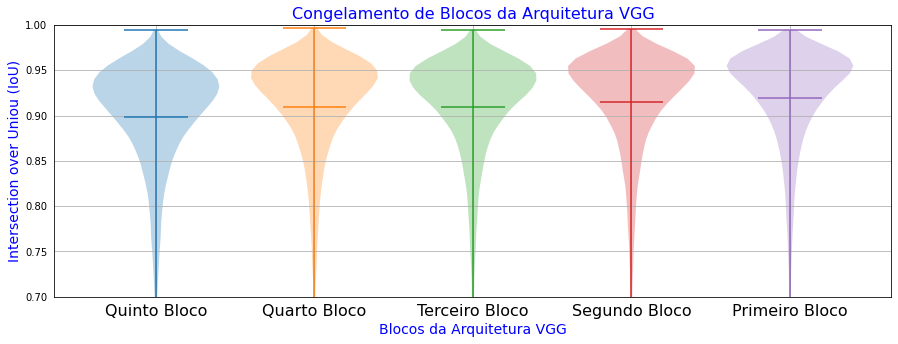

In [217]:
plt.figure(figsize = (15, 5))
plt.violinplot(iou_scores_list[0], positions = [1], showmeans = True, widths = 0.8)
plt.violinplot(iou_scores_list[1], positions = [2], showmeans = True, widths = 0.8)
plt.violinplot(iou_scores_list[2], positions = [3], showmeans = True, widths = 0.8)
plt.violinplot(iou_scores_list[3], positions = [4], showmeans = True, widths = 0.8)
plt.violinplot(iou_scores_list[4], positions = [5], showmeans = True, widths = 0.8)
plt.ylim([0.70, 1.0])
x_labels = ['Quinto Bloco', 'Quarto Bloco', 'Terceiro Bloco', 'Segundo Bloco', 'Primeiro Bloco']
plt.xticks(ticks = [1, 2, 3, 4, 5], labels = x_labels, size = 16, color = 'black')
plt.yticks(color = 'black')
plt.grid(True)
plt.xlabel('Blocos da Arquitetura VGG', size = 14, color = 'blue')
plt.ylabel('Intersection over Uniou (IoU)', size = 14, color = 'blue')
plt.title('Congelamento de Blocos da Arquitetura VGG', size = 16, color = 'blue')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

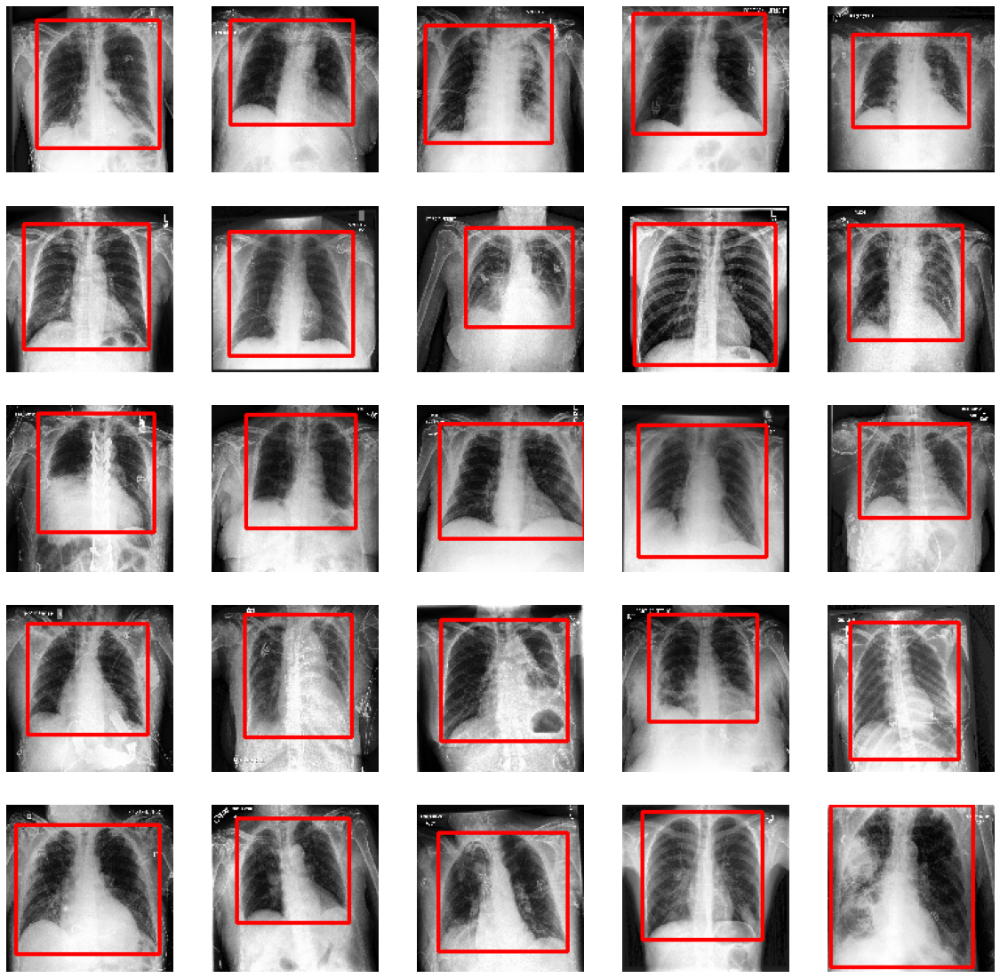

In [218]:
fig, axs = plt.subplots(nrows = 5, ncols = 5, figsize = (20, 20))
for i in range(0, 5):
  for j in range(0, 5):
    count = random.randrange(0, len(test_images))
    coordinates = model.predict(np.reshape(test_images[count], (1, 128, 128, 3)))[0]
    img = bbox_utils().draw_rectangle(image = test_images[count], list_coordinates = coordinates)
    axs[i, j].imshow(img)
    axs[i, j].axis('off')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

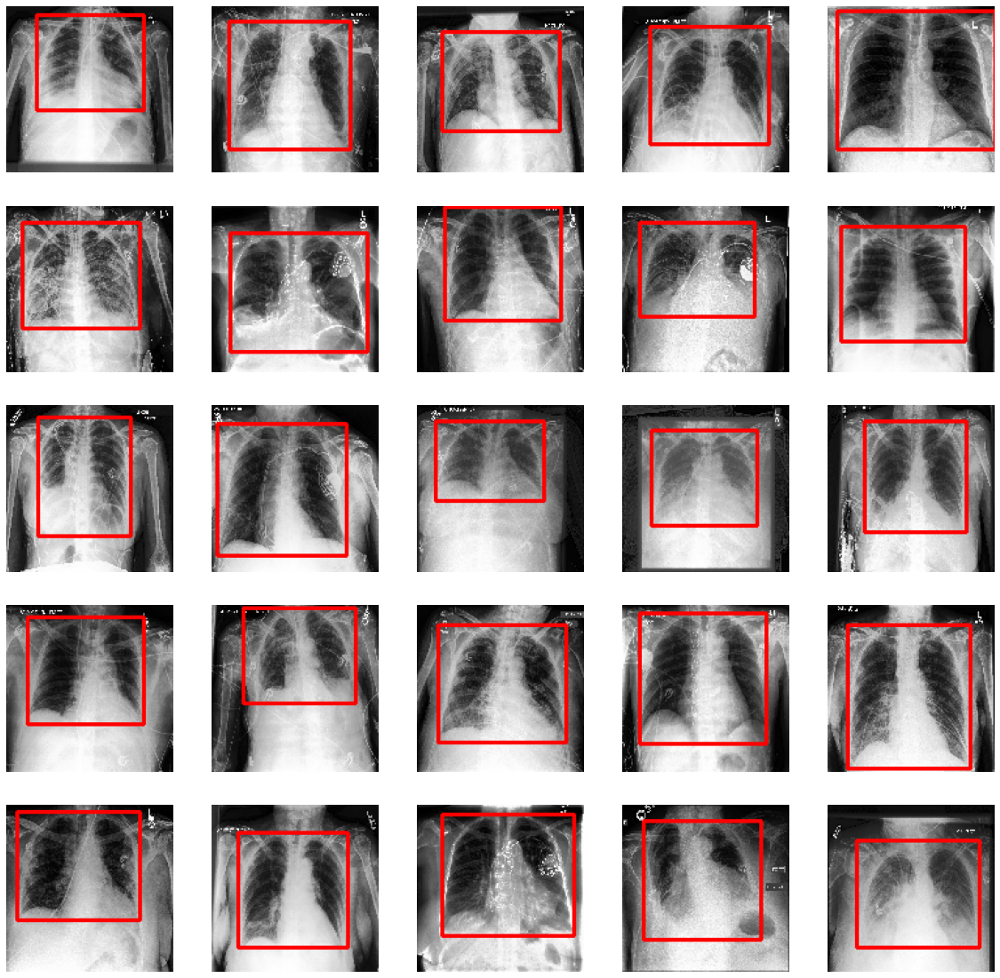

In [219]:
fig, axs = plt.subplots(nrows = 5, ncols = 5, figsize = (20, 20))
for i in range(0, 5):
  for j in range(0, 5):
    count = random.randrange(0, len(test_images))
    coordinates = model.predict(np.reshape(test_images[count], (1, 128, 128, 3)))[0]
    img = bbox_utils().draw_rectangle(image = test_images[count], list_coordinates = coordinates)
    axs[i, j].imshow(img)
    axs[i, j].axis('off')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

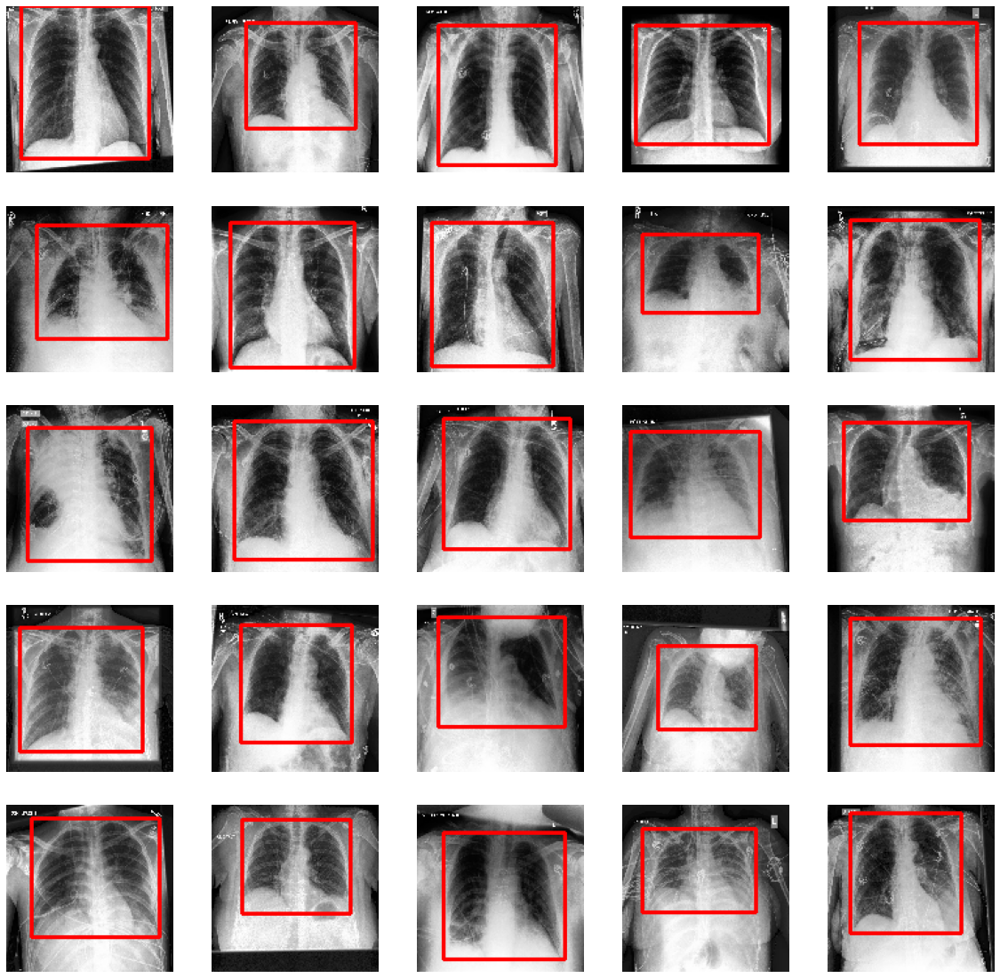

In [220]:
fig, axs = plt.subplots(nrows = 5, ncols = 5, figsize = (20, 20))
for i in range(0, 5):
  for j in range(0, 5):
    count = random.randrange(0, len(test_images))
    coordinates = model.predict(np.reshape(test_images[count], (1, 128, 128, 3)))[0]
    img = bbox_utils().draw_rectangle(image = test_images[count], list_coordinates = coordinates)
    axs[i, j].imshow(img)
    axs[i, j].axis('off')

## 9. Comparison of Methods
***

In [147]:
plot_df = pd.read_csv('/content/plot-data-chexpert.csv', delimiter = ',', 
                      usecols = ['Path', 'p1_x', 'p1_y', 'p2_x', 'p2_y'])

data_gen = tf.keras.preprocessing.image.ImageDataGenerator(rescale = 1./255.)

plot_generator = data_gen.flow_from_dataframe(dataframe = plot_df, directory = '', x_col = 'Path',
                                              y_col = ['p1_x', 'p1_y', 'p2_x', 'p2_y'], 
                                              target_size = (128, 128), color_mode = 'rgb', batch_size = 50,
                                              class_mode = 'raw', shuffle = False, seed = 42)

plot_x, plot_y = plot_generator[0]
plot_files = list(plot_df['Path'])

Found 50 validated image filenames.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

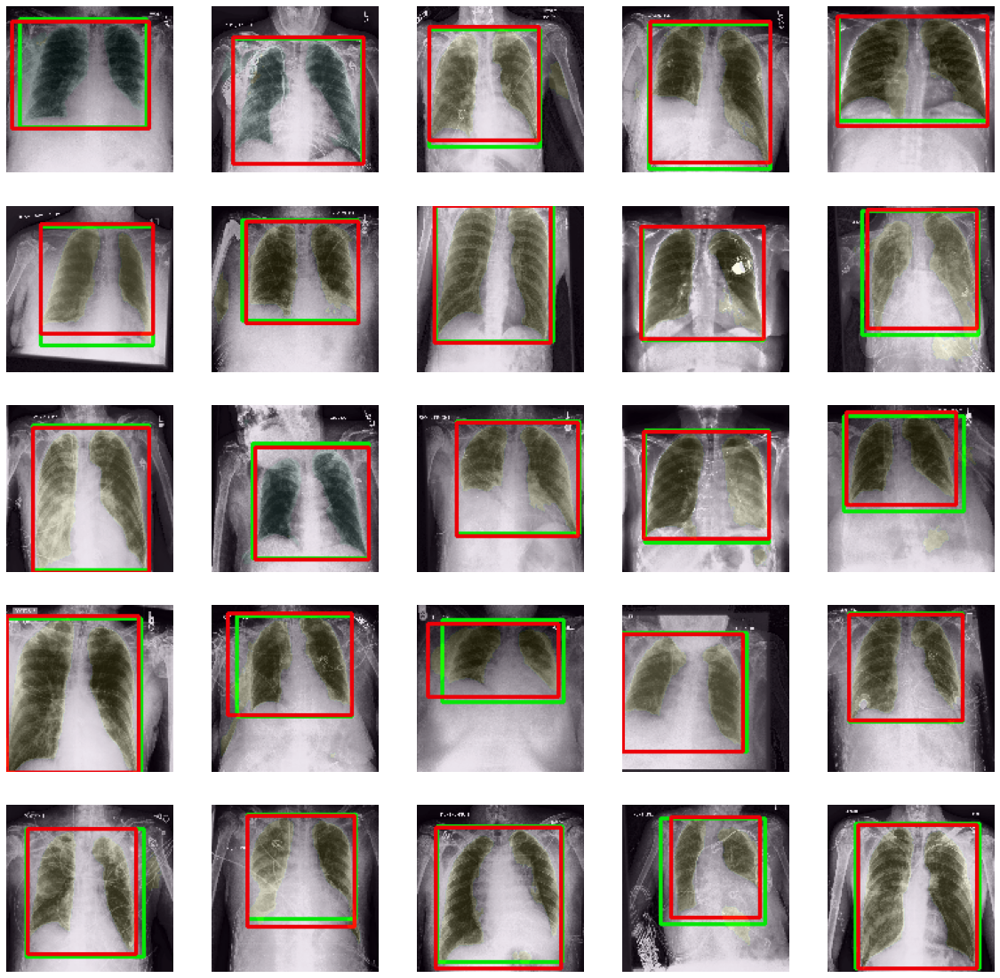

In [221]:
fig, axs = plt.subplots(nrows = 5, ncols = 5, figsize = (20, 20))
count = 0
for i in range(0, 5):
  for j in range(0, 5):
    img, mask = bbox_utils().make_segmentation(model = seg_model, path_image = plot_files[count])
    coordinates = model.predict(np.reshape(plot_x[count], (1, 128, 128, 3)))[0]
    img = bbox_utils().draw_rectangle(plot_x[count], coordinates, color = (0, 255, 0), thickness = 2)
    axs[i, j].imshow(img)
    axs[i, j].imshow(bbox_utils().draw_rectangle(image = img, list_coordinates = plot_y[count], 
                                                 color = (255, 0, 0), thickness = 2))
    mask = bbox_utils().resize_image(image = bbox_utils().join_masks(lung_left = mask[0], lung_right = mask[1]), 
                                     shape = (128, 128))
    axs[i, j].imshow(mask, alpha = 0.1)
    axs[i, j].axis('off')
    count += 1

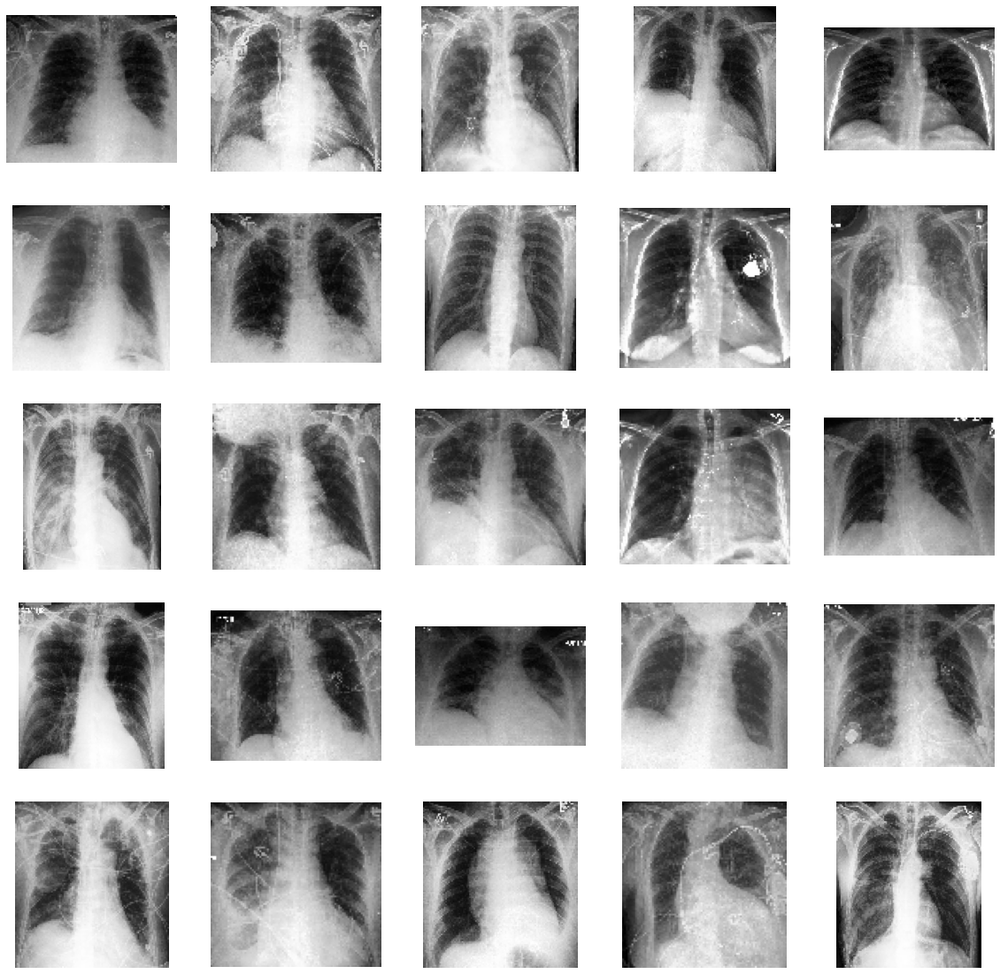

In [222]:
fig, axs = plt.subplots(nrows = 5, ncols = 5, figsize = (20, 20))
count = 0
for i in range(0, 5):
  for j in range(0, 5):
    coordinates = model.predict(np.reshape(plot_x[count], (1, 128, 128, 3)))[0]
    img = bbox_utils().crop_image(image = plot_x[count], list_coordinates = coordinates)
    axs[i, j].imshow(img)
    axs[i, j].axis('off')
    count += 1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

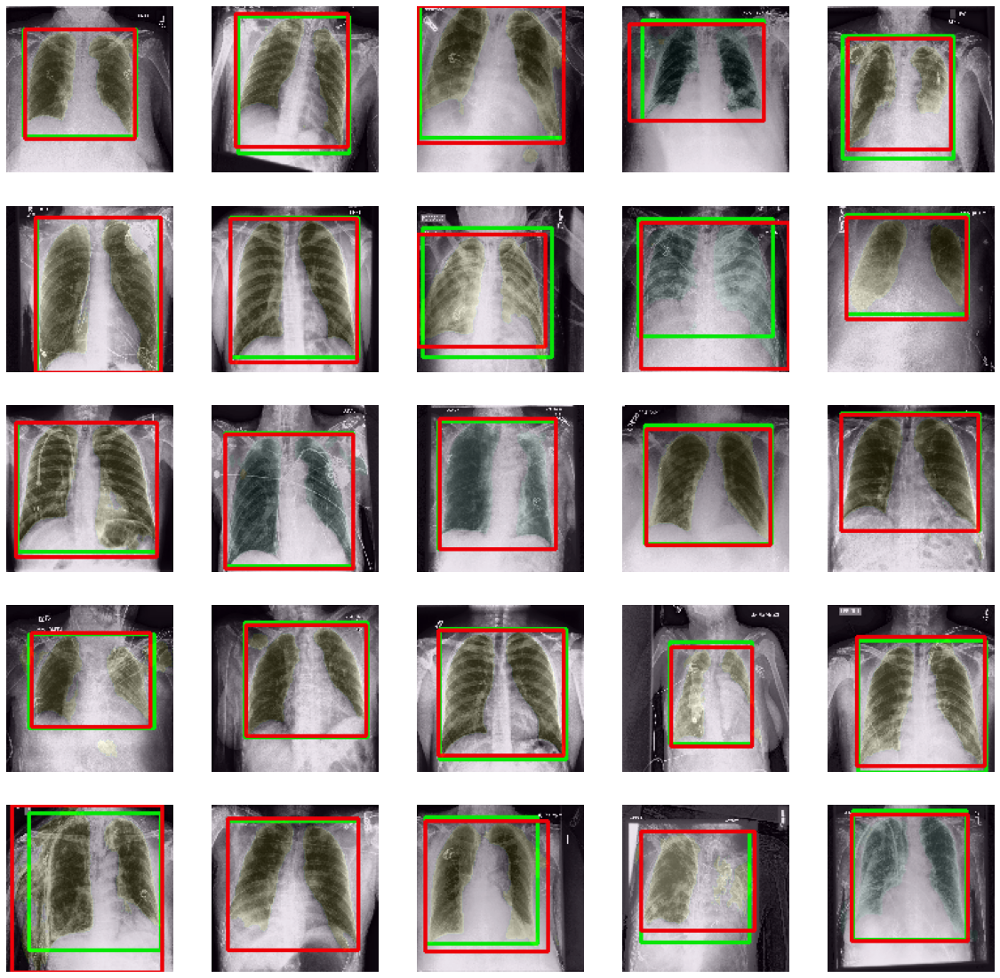

In [223]:
fig, axs = plt.subplots(nrows = 5, ncols = 5, figsize = (20, 20))
count = 25
for i in range(0, 5):
  for j in range(0, 5):
    img, mask = bbox_utils().make_segmentation(model = seg_model, path_image = plot_files[count])
    coordinates = model.predict(np.reshape(plot_x[count], (1, 128, 128, 3)))[0]
    img = bbox_utils().draw_rectangle(plot_x[count], coordinates, color = (0, 255, 0), thickness = 2)
    axs[i, j].imshow(img)
    axs[i, j].imshow(bbox_utils().draw_rectangle(image = img, list_coordinates = plot_y[count], 
                                                 color = (255, 0, 0), thickness = 2))
    mask = bbox_utils().resize_image(image = bbox_utils().join_masks(lung_left = mask[0], lung_right = mask[1]), 
                                     shape = (128, 128))
    axs[i, j].imshow(mask, alpha = 0.1)
    axs[i, j].axis('off')
    count += 1

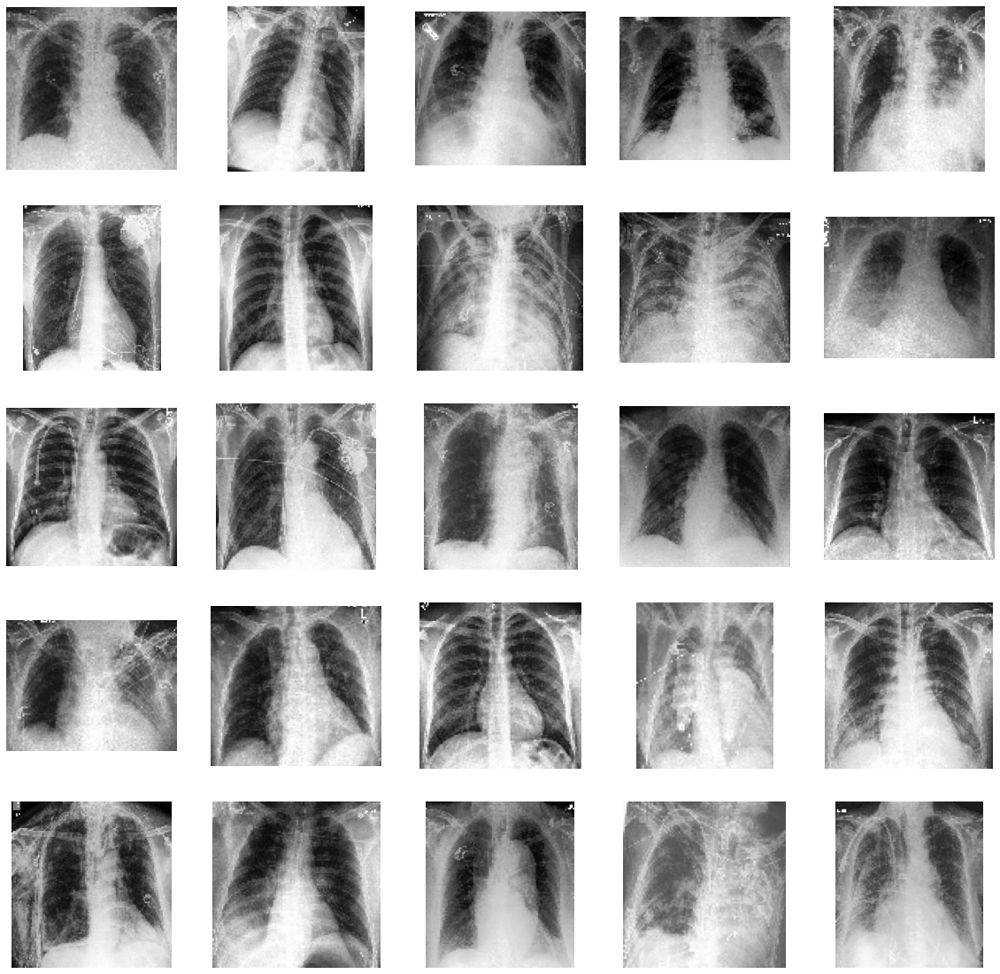

In [224]:
fig, axs = plt.subplots(nrows = 5, ncols = 5, figsize = (20, 20))
count = 25
for i in range(0, 5):
  for j in range(0, 5):
    coordinates = model.predict(np.reshape(plot_x[count], (1, 128, 128, 3)))[0]
    img = bbox_utils().crop_image(image = plot_x[count], list_coordinates = coordinates)
    axs[i, j].imshow(img)
    axs[i, j].axis('off')
    count += 1

## 10. Testing in another database
***

In [ ]:
!cp -r /content/gdrive/MyDrive/montglomery-shenzhen-datasets.zip /content/
!unzip /content/montglomery-shenzhen-datasets.zip
!rm /content/montglomery-shenzhen-datasets.zip

In [67]:
filelist_montgomery = glob.glob('/content/Montgomery/MontgomerySet/CXR_png/*.png')
filelist_shenzen = glob.glob('/content/ChinaSet_AllFiles/ChinaSet_AllFiles/CXR_png/*.png')

print('Number of Images from Montgomery Dataset:', len(filelist_montgomery), 'imagens')
print('Number of Images from Shenzhen Dataset:', len(filelist_shenzen), 'imagens')

montgomery_df = pd.DataFrame(filelist_montgomery, columns = ['Path'])
montgomery_df['Labels'] = np.zeros((len(filelist_montgomery, )))
shenzen_df = pd.DataFrame(filelist_shenzen, columns = ['Path'])
shenzen_df['Labels'] = np.zeros((len(filelist_shenzen, )))

Number of Images from Montgomery Dataset: 138 imagens
Number of Images from Shenzhen Dataset: 662 imagens


In [68]:
montgomery_generator = data_gen.flow_from_dataframe(dataframe = montgomery_df, directory = '', x_col = 'Path',
                                                    y_col = ['Labels'], target_size = (128, 128), 
                                                    color_mode = 'rgb', batch_size = 64, class_mode = 'raw', 
                                                    shuffle = False, seed = 42)

shenzen_generator = data_gen.flow_from_dataframe(dataframe = shenzen_df, directory = '', x_col = 'Path',
                                                 y_col = ['Labels'], target_size = (128, 128), 
                                                 color_mode = 'rgb', batch_size = 64, class_mode = 'raw', 
                                                 shuffle = False, seed = 42)

for i in range(0, len(montgomery_generator)):
  x, y = montgomery_generator[i]
  if i == 0:
    images_mont, labels_mont = x, y
  else:
    images_mont, labels_mont = np.concatenate((images_mont, x)), np.concatenate((labels_mont, y))

for i in range(0, len(shenzen_generator)):
  x, y = shenzen_generator[i]
  if i == 0:
    images_shen, labels_shen = x, y
  else:
    images_shen, labels_shen = np.concatenate((images_shen, x)), np.concatenate((labels_shen, y))

Found 138 validated image filenames.
Found 662 validated image filenames.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

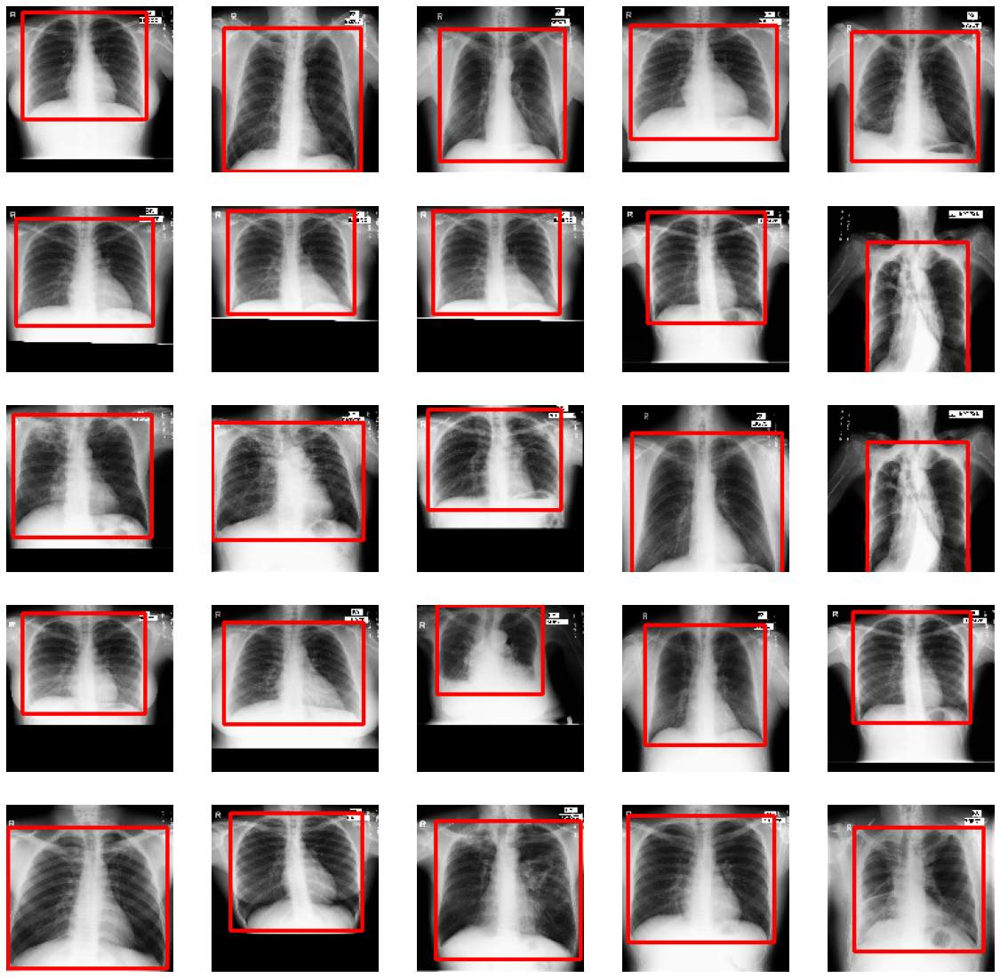

In [225]:
fig, axs = plt.subplots(nrows = 5, ncols = 5, figsize = (20, 20))
for i in range(0, 5):
  for j in range(0, 5):
    count = random.randrange(0, len(images_mont))
    coordinates = model.predict(np.reshape(images_mont[count], (1, 128, 128, 3)))[0]
    axs[i, j].imshow(bbox_utils().draw_rectangle(image = images_mont[count], list_coordinates = coordinates))
    axs[i, j].axis('off')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

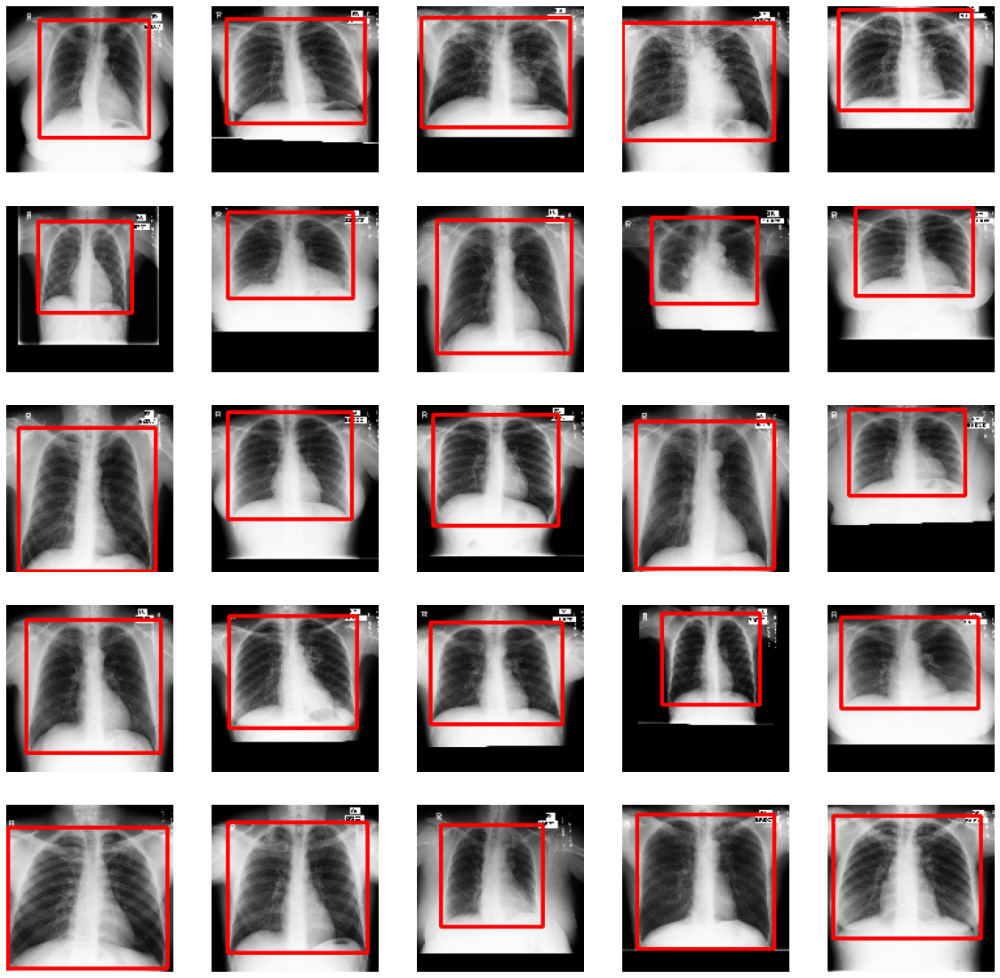

In [226]:
fig, axs = plt.subplots(nrows = 5, ncols = 5, figsize = (20, 20))
for i in range(0, 5):
  for j in range(0, 5):
    count = random.randrange(0, len(images_mont))
    coordinates = model.predict(np.reshape(images_mont[count], (1, 128, 128, 3)))[0]
    axs[i, j].imshow(bbox_utils().draw_rectangle(image = images_mont[count], list_coordinates = coordinates))
    axs[i, j].axis('off')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

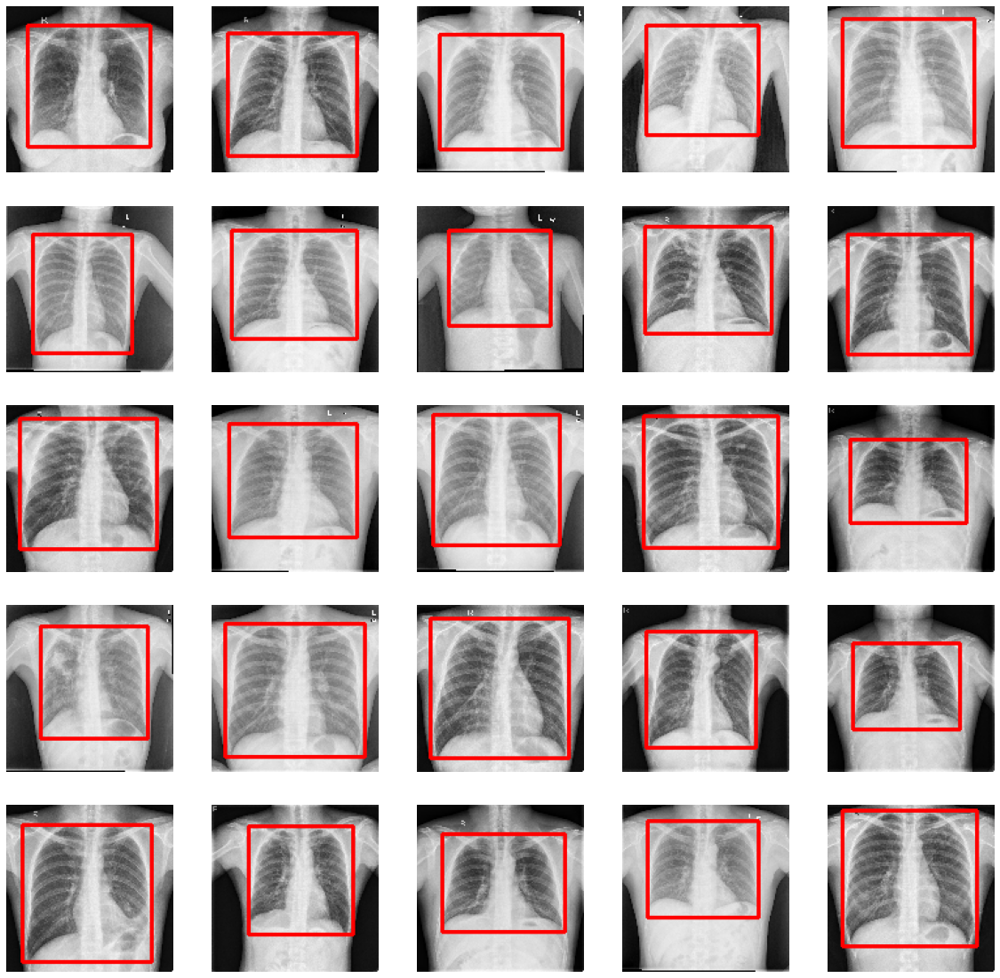

In [227]:
fig, axs = plt.subplots(nrows = 5, ncols = 5, figsize = (20, 20))
for i in range(0, 5):
  for j in range(0, 5):
    count = random.randrange(0, len(images_shen))
    coordinates = model.predict(np.reshape(images_shen[count], (1, 128, 128, 3)))[0]
    axs[i, j].imshow(bbox_utils().draw_rectangle(image = images_shen[count], list_coordinates = coordinates))
    axs[i, j].axis('off')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

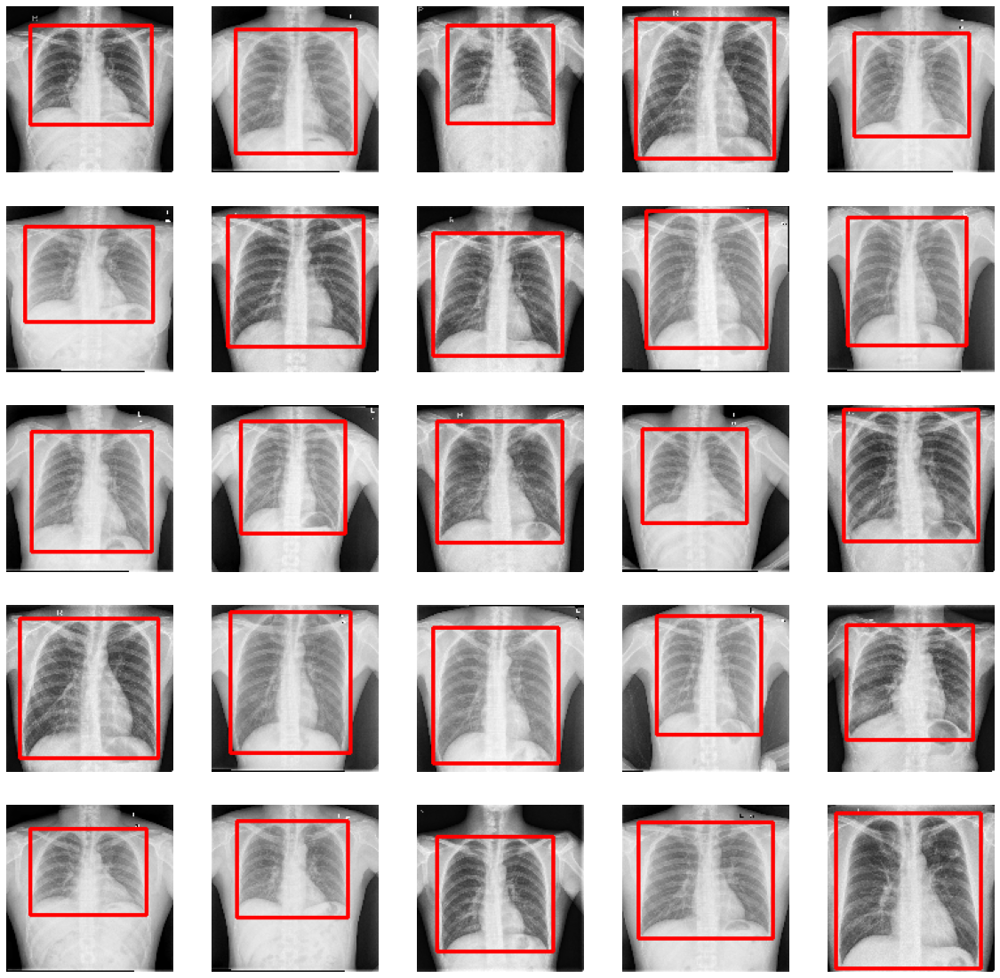

In [228]:
fig, axs = plt.subplots(nrows = 5, ncols = 5, figsize = (20, 20))
for i in range(0, 5):
  for j in range(0, 5):
    count = random.randrange(0, len(images_shen))
    coordinates = model.predict(np.reshape(images_shen[count], (1, 128, 128, 3)))[0]
    axs[i, j].imshow(bbox_utils().draw_rectangle(image = images_shen[count], list_coordinates = coordinates))
    axs[i, j].axis('off')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

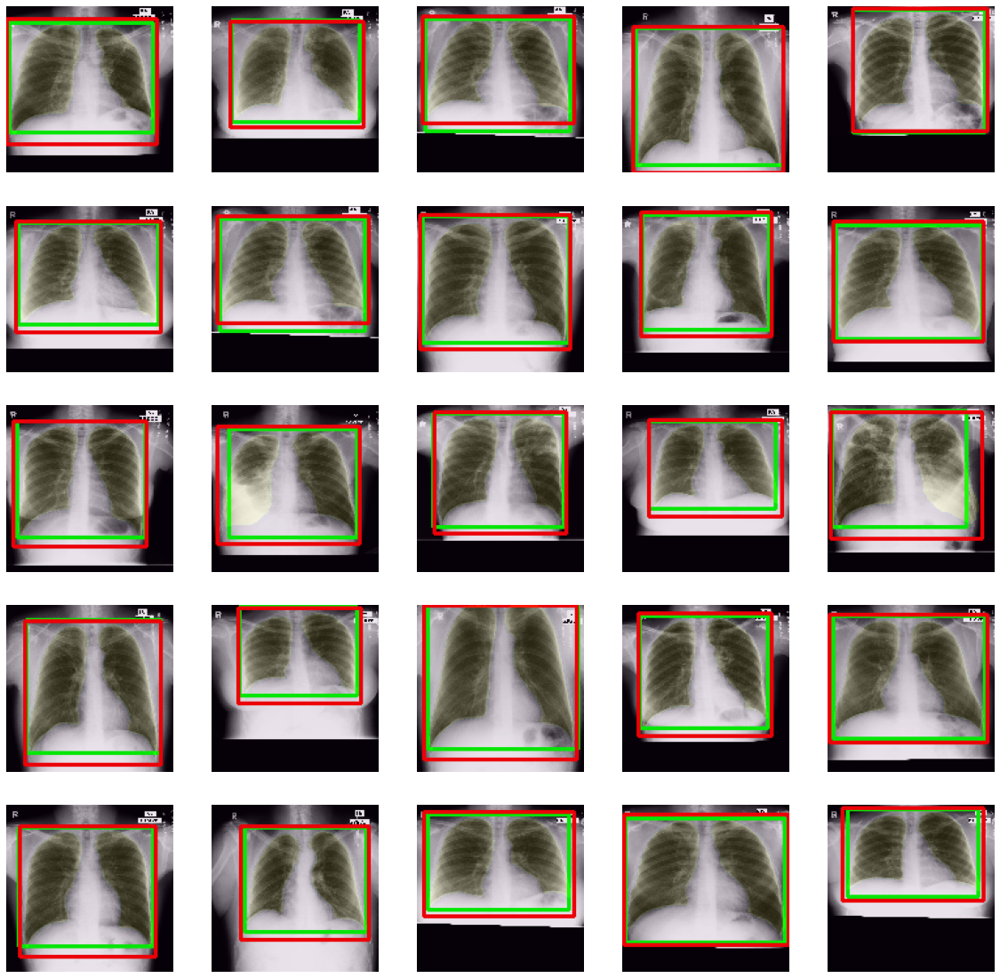

In [229]:
mem_count = list()
fig, axs = plt.subplots(nrows = 5, ncols = 5, figsize = (20, 20))
for i in range(0, 5):
  for j in range(0, 5):
    count = random.randrange(0, len(filelist_montgomery))
    img, mask = bbox_utils().make_segmentation(model = seg_model, path_image = filelist_montgomery[count])
    original_mask = bbox_utils().join_masks(lung_left = mask[0], lung_right = mask[1])
    contours = bbox_utils().get_contours(mask = original_mask.copy())
    mask_contours = bbox_utils().draw_contours(contours = bbox_utils().find_two_best_areas(contours = contours), 
                                               image_shape = img.shape)
    list_coordinates = bbox_utils().extract_coordinates(mask = mask_contours)
    coordinates = model.predict(np.reshape(images_mont[count], (1, 128, 128, 3)))[0]
    img = bbox_utils().draw_rectangle(images_mont[count], coordinates, color = (0, 255, 0), thickness = 2)
    axs[i, j].imshow(bbox_utils().draw_rectangle(image = img, list_coordinates = list_coordinates, 
                                                 color = (255, 0, 0), thickness = 2))
    original_mask = bbox_utils().resize_image(image = original_mask, shape = (128, 128))
    axs[i, j].imshow(original_mask, alpha = 0.1)
    axs[i, j].axis('off')
    mem_count.append(count)

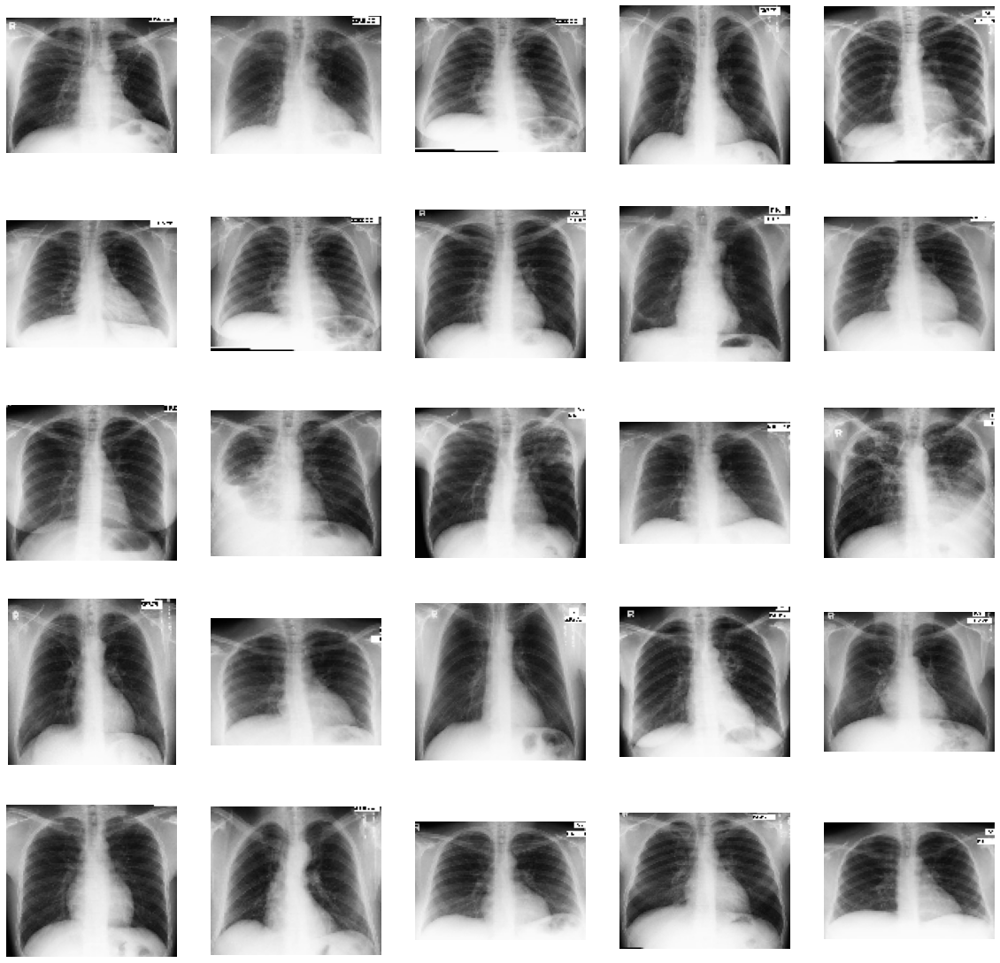

In [230]:
fig, axs = plt.subplots(nrows = 5, ncols = 5, figsize = (20, 20))
count = 0
for i in range(0, 5):
  for j in range(0, 5):
    coordinates = model.predict(np.reshape(images_mont[mem_count[count]], (1, 128, 128, 3)))[0]
    img = bbox_utils().crop_image(image = images_mont[mem_count[count]], list_coordinates = coordinates)
    axs[i, j].imshow(img)
    axs[i, j].axis('off')
    count += 1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

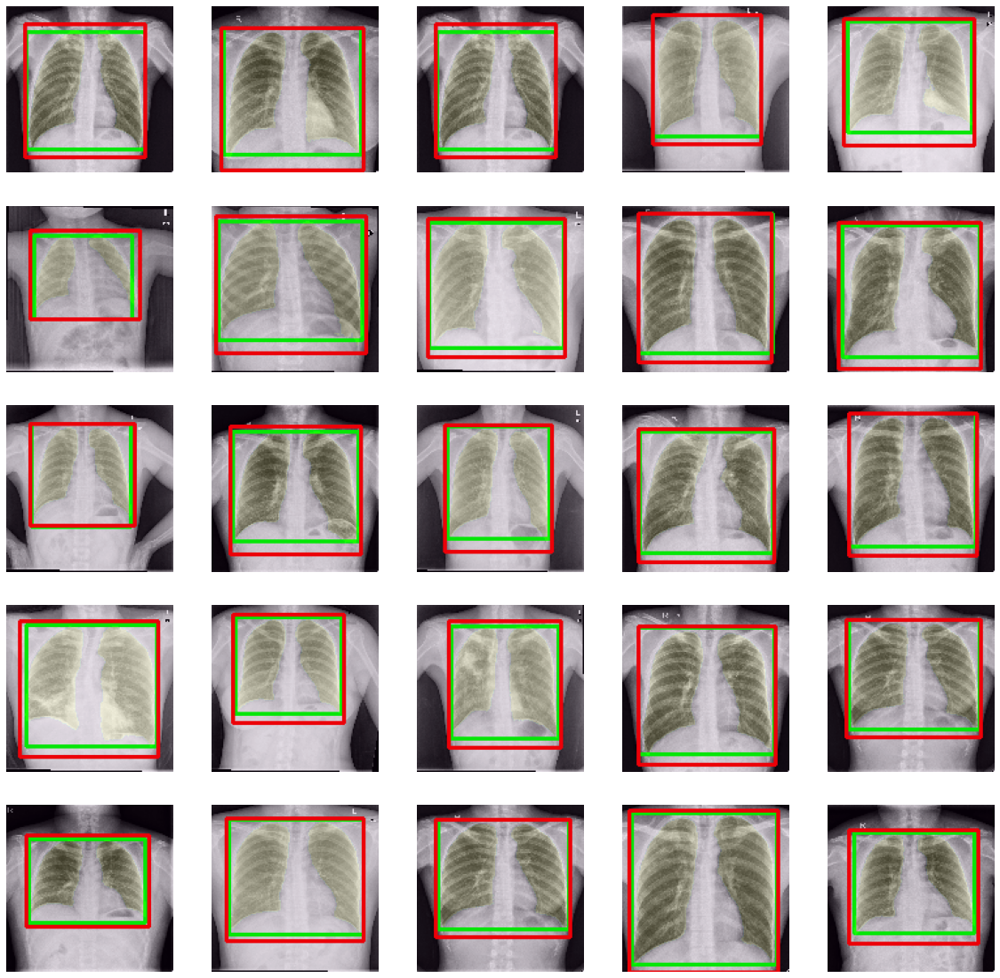

In [231]:
mem_count = list()
fig, axs = plt.subplots(nrows = 5, ncols = 5, figsize = (20, 20))
for i in range(0, 5):
  for j in range(0, 5):
    count = random.randrange(0, len(filelist_shenzen))
    img, mask = bbox_utils().make_segmentation(model = seg_model, path_image = filelist_shenzen[count])
    original_mask = bbox_utils().join_masks(lung_left = mask[0], lung_right = mask[1])
    contours = bbox_utils().get_contours(mask = original_mask.copy())
    mask_contours = bbox_utils().draw_contours(contours = bbox_utils().find_two_best_areas(contours = contours), 
                                               image_shape = img.shape)
    list_coordinates = bbox_utils().extract_coordinates(mask = mask_contours)
    coordinates = model.predict(np.reshape(images_shen[count], (1, 128, 128, 3)))[0]
    img = bbox_utils().draw_rectangle(images_shen[count], coordinates, color = (0, 255, 0), thickness = 2)
    axs[i, j].imshow(bbox_utils().draw_rectangle(image = img, list_coordinates = list_coordinates, 
                                                 color = (255, 0, 0), thickness = 2))
    original_mask = bbox_utils().resize_image(image = original_mask, shape = (128, 128))
    axs[i, j].imshow(original_mask, alpha = 0.1)
    axs[i, j].axis('off')
    mem_count.append(count)

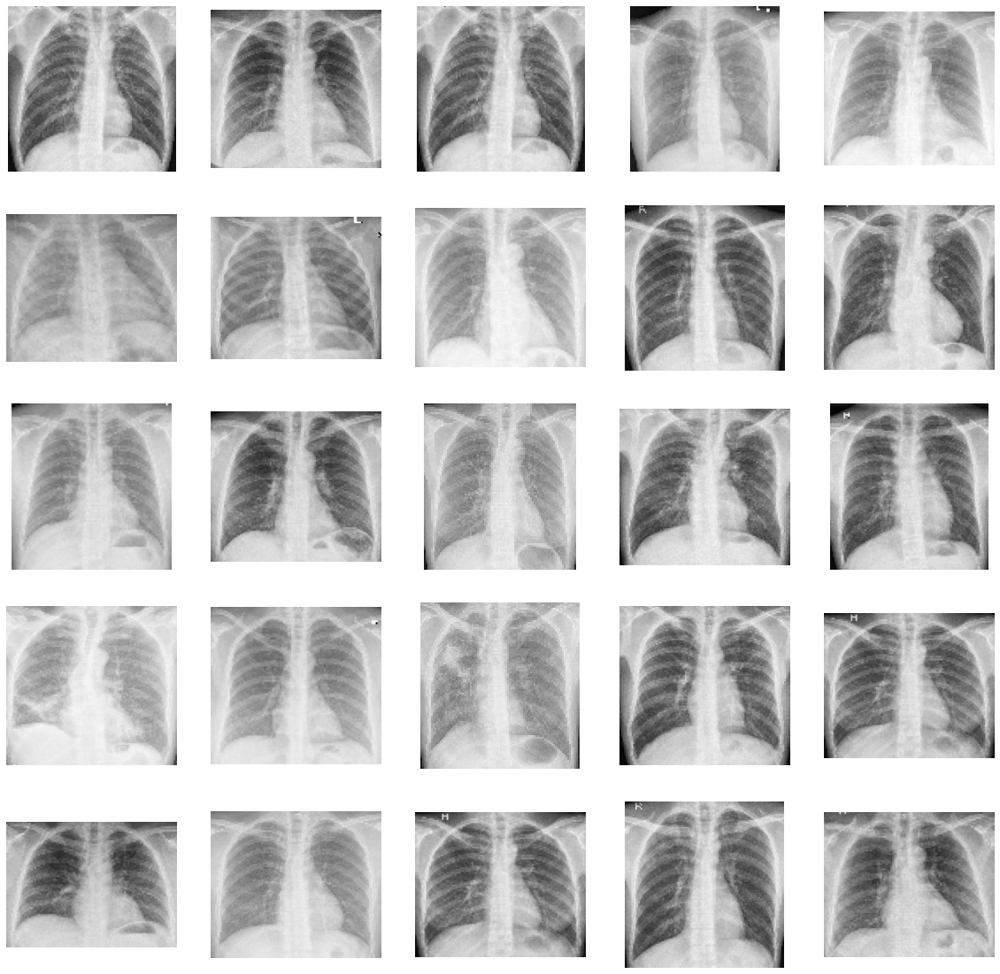

In [232]:
fig, axs = plt.subplots(nrows = 5, ncols = 5, figsize = (20, 20))
count = 0
for i in range(0, 5):
  for j in range(0, 5):
    coordinates = model.predict(np.reshape(images_shen[mem_count[count]], (1, 128, 128, 3)))[0]
    img = bbox_utils().crop_image(image = images_shen[mem_count[count]], list_coordinates = coordinates)
    axs[i, j].imshow(img)
    axs[i, j].axis('off')
    count += 1

## 11. Comparação de Tempo de Inferência
***

In [233]:
start_time = time.time()
coordinates_list = list()
for image in plot_files:
  img, mask = bbox_utils().make_segmentation(model = seg_model, path_image = image)
  original_mask = bbox_utils().join_masks(lung_left = mask[0], lung_right = mask[1])
  list_coordinates = bbox_utils().extract_coordinates(mask = original_mask)
  coordinates_list.append(list_coordinates)
end_time = time.time()

print('Pulmonary Segmentation')
print('Runtime: {:.3f} milliseconds'.format(((end_time - start_time) / 50) * 1000))

Pulmonary Segmentation
Runtime: 29.457 milliseconds


In [234]:
start_time = time.time()
coordinates_list = list()
for image in plot_files:
  img, mask = bbox_utils().make_segmentation(model = seg_model, path_image = image)
  original_mask = bbox_utils().join_masks(lung_left = mask[0], lung_right = mask[1])
  contours = bbox_utils().get_contours(mask = original_mask.copy())
  mask_contours = bbox_utils().draw_contours(contours = bbox_utils().find_two_best_areas(contours =contours), 
                                             image_shape = img.shape)
  list_coordinates = bbox_utils().extract_coordinates(mask = mask_contours)
  coordinates_list.append(list_coordinates)

end_time = time.time()

print('Pulmonary Segmentation + Image Processing')
print('Runtime: {:.3f} milliseconds'.format(((end_time - start_time) / 50) * 1000))

Pulmonary Segmentation + Image Processing
Runtime: 48.832 milliseconds


In [235]:
start_time = time.time()
for image in plot_files:
  coordinates_list  = model.predict(plot_x)
end_time = time.time()

print('Convolutional Neural Networks')
print('Runtime: {:.3f} milliseconds'.format(((end_time - start_time) / 50) * 1000))

Convolutional Neural Networks
Runtime: 1.676 milliseconds


|**Method**|**Inference Time (milliseconds)**|
|:-|:-:|
|Pulmonary Segmentation|29.457|
|Pulmonary Segmentation + Image Processing|48.832|
|Convolutional Neural Networks|1.676|